In [1]:
from PIL import Image 
from IPython.display import display

In [2]:
lake_img = Image.open('lake.jpeg')

In [6]:
import os

In [8]:
os.listdir('/Users/anthonywang/Deep_Learning/landscape_scrambled/')

[]

In [13]:
import numpy as np

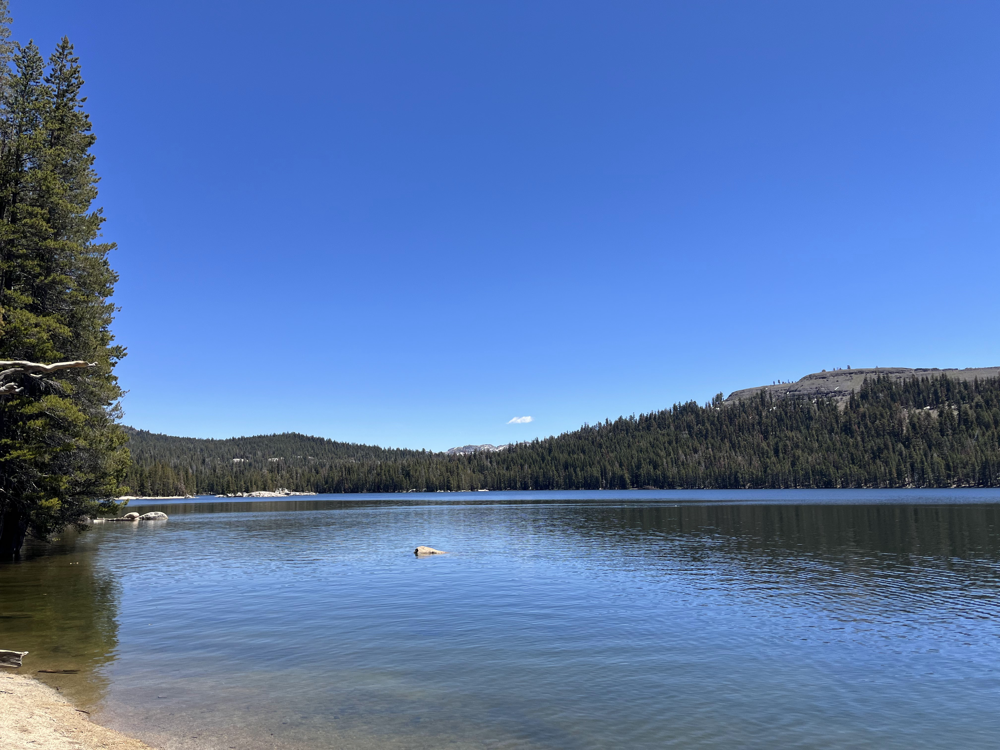

In [5]:
lake_img

In [14]:
def get_scrambled_img(arr, x, y, r):
    arr_copy = np.copy(arr)
    square = np.copy(arr[x-r:x+r, y-r:y+r, :])
    np.random.shuffle(square)
    arr_copy[x-r:x+r, y-r:y+r, :] = square
    return arr_copy

In [8]:
old_square = np.copy(lake_data[100:300, 100:300, :])
new_square = np.copy(lake_data[100:300, 100:300, :])

In [31]:
def get_discolored_img(arr, x, y, r, discolor_ratio=1):
    arr_copy = np.copy(arr)
    square = np.copy(arr[x-r:x+r, y-r:y+r, :])
    arr_copy[x-r:x+r, y-r:y+r, :] = discolor_ratio*square
    return arr_copy

In [25]:
import pandas as pd

In [71]:
! rm -rf /Users/anthonywang/Deep_Learning/landscape_scrambled/
! rm /Users/anthonywang/Deep_Learning/scrambled_imgs_df.csv
! mkdir /Users/anthonywang/Deep_Learning/landscape_scrambled/

raw_img_folder = '/Users/anthonywang/Deep_Learning/landscape/'
scrambled_img_folder = '/Users/anthonywang/Deep_Learning/landscape_scrambled/'
raw_img_names = os.listdir(raw_img_folder)
rows = []

for i, raw_img_name in enumerate(raw_img_names):
    row = {}
    raw_img = Image.open(raw_img_folder + raw_img_name)
    raw_img = raw_img.resize((800, 800), Image.ANTIALIAS)
    raw_img_arr = np.array(raw_img)
    x = np.random.randint(100, 701)
    y = np.random.randint(100, 701)
    r = max(30, np.random.randint(min(min(x, 800-x), min(y, 800-y))))
    discolor_ratio = round(np.random.uniform(1.05, 1.15), 2)
    scrambled_img_arr = get_discolored_img(raw_img_arr, x, y, r, discolor_ratio)
    scrambled_img = Image.fromarray(scrambled_img_arr)
    scrambled_img_name = scrambled_img_folder + str(i) + '.jpg'
    scrambled_img.save(scrambled_img_name, 'JPEG')
    row['x'] = x
    row['y'] = y
    row['r'] = r
    row['discolor_ratio'] = discolor_ratio
    row['img_path'] = scrambled_img_name
    rows.append(row)
    


df = pd.DataFrame(rows)
df.to_csv('scrambled_imgs_df.csv', encoding='utf-8', index=True)
df.head()

,x,y,r,discolor_ratio,img_path
0,599,120,89,1.08,/Users/anthonywang/Deep_Learning/landscape_scr...
1,376,646,30,1.08,/Users/anthonywang/Deep_Learning/landscape_scr...
2,246,281,30,1.10,/Users/anthonywang/Deep_Learning/landscape_scr...
3,480,360,174,1.08,/Users/anthonywang/Deep_Learning/landscape_scr...
4,223,430,111,1.14,/Users/anthonywang/Deep_Learning/landscape_scr...
